<a href="https://colab.research.google.com/github/alfazick/AppliedLLMCourse/blob/main/part1ExploreMultiModal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

!pip install -U -q git+https://github.com/huggingface/transformers.git git+https://github.com/huggingface/trl.git datasets bitsandbytes peft qwen-vl-utils wandb accelerate
!pip install matplotlib IPython
!pip install -q torch==2.4.1+cu121 torchvision==0.19.1+cu121 torchaudio==2.4.1+cu121 --extra-index-url https://download.pytorch.org/whl/cu121

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 59.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 82.0 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 53.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [matplotlib]5 [matplotlib]


In [ ]:
# Cell 1 - Force reinstall PyTorch 2.4.1
!pip uninstall torch torchvision torchaudio -y
!pip install torch==2.4.1+cu121 torchvision==0.19.1+cu121 torchaudio==2.4.1+cu121 --extra-index-url https://download.pytorch.org/whl/cu121

Found existing installation: torch 2.4.1+cu121
Uninstalling torch-2.4.1+cu121:
  Successfully uninstalled torch-2.4.1+cu121
Found existing installation: torchvision 0.19.1+cu121
Uninstalling torchvision-0.19.1+cu121:
  Successfully uninstalled torchvision-0.19.1+cu121
Found existing installation: torchaudio 2.4.1+cu121
Uninstalling torchaudio-2.4.1+cu121:
  Successfully uninstalled torchaudio-2.4.1+cu121
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu121
  Using cached https://download.pytorch.org/whl/cu121/torch-2.4.1%2Bcu121-cp312-cp312-linux_x86_64.whl (798.9 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchvision-0.19.1%2Bcu121-cp312-cp312-linux_x86_64.whl (7.1 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchaudio-2.4.1%2Bcu121-cp312-cp312-linux_x86_64.whl (3.4 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [torchaudio]3 [torchaudio]]


In [ ]:
# Cell 2 - MUST restart kernel
import os
os._exit(0)  # This forces kernel restart

In [ ]:
# Cell 3 - Run AFTER kernel restarts (wait for [*] to disappear)
import torch
print(f'PyTorch: {torch.__version__}')  # Should now show 2.4.1

PyTorch: 2.4.1+cu121


In [ ]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

In [ ]:
import importlib
# Cell 3 - Verify exact versions from notebook requirements
requirements = {
    'torch': '2.4.1',
    'transformers': '4.47.0.dev0',
    'trl': '0.12.0.dev0',
    'datasets': '3.0.2',
    'bitsandbytes': '0.44.1',
    'peft': '0.13.2',
    'qwen-vl-utils': '0.0.8',
    'wandb': '0.18.5',
    'accelerate': '1.0.1'
}

print("=== VERSION CHECK ===")
for package, expected in requirements.items():
    try:
        module = importlib.import_module(package.replace('-', '_'))
        actual = getattr(module, '__version__', 'unknown')
        if 'dev' in expected:
            # Dev versions just check if it's dev
            status = "✅" if 'dev' in actual else "⚠️"
        else:
            status = "✅" if actual == expected else "⚠️"
        print(f"{status} {package}: {actual} (expected: {expected})")
    except ImportError:
        print(f"❌ {package}: NOT INSTALLED (expected: {expected})")

=== VERSION CHECK ===
⚠️ torch: 2.4.1+cu121 (expected: 2.4.1)
✅ transformers: 5.0.0.dev0 (expected: 4.47.0.dev0)
✅ trl: 0.26.0.dev0 (expected: 0.12.0.dev0)
⚠️ datasets: 4.4.1 (expected: 3.0.2)
⚠️ bitsandbytes: 0.48.2 (expected: 0.44.1)
⚠️ peft: 0.17.1 (expected: 0.13.2)
⚠️ qwen-vl-utils: unknown (expected: 0.0.8)
⚠️ wandb: 0.22.3 (expected: 0.18.5)
⚠️ accelerate: 1.11.0 (expected: 1.0.1)


In [ ]:
# Run this to confirm everything works together:
from transformers import Qwen2VLForConditionalGeneration, AutoProcessor
from qwen_vl_utils import process_vision_info
import torch
import peft
import bitsandbytes as bnb

print("✅ All critical imports working!")
print(f"✅ PyTorch CUDA: {torch.cuda.is_available()}")
print(f"✅ GPU: {torch.cuda.get_device_name(0)}")
print("\n🎉 YOUR ENVIRONMENT IS READY FOR QWEN2-VL!")

✅ All critical imports working!
✅ PyTorch CUDA: True
✅ GPU: NVIDIA GeForce RTX 4090

🎉 YOUR ENVIRONMENT IS READY FOR QWEN2-VL!


In [ ]:
### Actual Work Step #1 Data Exploration

from datasets import load_dataset
dataset_id = "openfoodfacts/nutrition-table-detection"
nutrition_data = load_dataset(dataset_id)

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00002.parquet:   0%|          | 0.00/291M [00:00<?, ?B/s]

data/train-00001-of-00002.parquet:   0%|          | 0.00/285M [00:00<?, ?B/s]

data/val-00000-of-00001.parquet:   0%|          | 0.00/64.2M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1083 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/123 [00:00<?, ? examples/s]

In [ ]:
nutrition_data['train'].features

{'image_id': Value('string'),
 'image': Image(mode=None, decode=True),
 'width': Value('int64'),
 'height': Value('int64'),
 'meta': {'barcode': Value('string'),
  'off_image_id': Value('string'),
  'image_url': Value('string')},
 'objects': {'bbox': List(List(Value('float32'))),
  'category_id': List(Value('int64')),
  'category_name': List(Value('string'))}}

In [ ]:
sample = nutrition_data['train'][0]
sample

{'image_id': '0009800892204_1',
 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=2592x1944>,
 'width': 2592,
 'height': 1944,
 'meta': {'barcode': '0009800892204',
  'off_image_id': '1',
  'image_url': 'https://static.openfoodfacts.org/images/products/000/980/089/2204/1.jpg'},
 'objects': {'bbox': [[0.057098764926195145,
    0.014274691231548786,
    0.603501558303833,
    0.991126537322998]],
  'category_id': [0],
  'category_name': ['nutrition-table']}}

In [ ]:
print(2592%28==0,1944%28==0)

False False


In [ ]:
# My Analysis 7-8 November
# https://arxiv.org/pdf/2409.12191

# so according to QWen Paper logic

# They use dynamic resolution approach
# so width and height will be checked if its within the range
# min < x < max
# Q1:  what if it doesn't fit ?

# another aspect is tokenization so image will be patched 28*28 pixels
# and then converted to single token
# so paper says they use dynamic token count
# small resolution 100 token high resolution 1000 tokens
# Q2: What if width and height are not divisible by 28? what distortion will happen
# or like padding token? Probably will look by myself


# interestin field is 'objects''bbox' paper says
# it's bounding box which has format
#[Xtopleft,Ytopleft,Xbottomright,Ybottomright]
# interesting part is it's scaled between 0 and 1, but paper has it between 0,999
# so probably will just multiply by 1000, what is an edge,  ?
# need to write converter function


# token special is <|box_start|>(),() <|box_end|> # need to be careful here it look like a tuple
# another  interesting token is an image
# <|vision_start> image tokens ??? <|vision_end|>

# ok so another important data seems to me
# 'category_name': ['nutriotonal-table']
# above mentioned boxes some some useful text description
# <|object_ref_start|> what is in the box <|object_ref_end>
# I am pretty sure that what I will need

# ok so based on data sample, I think I only need
# "image", "objects""bbox" and "objects""category_name"
# other than rest is just metadata

# i am just starting exploring may be "width" and "height" will be useful




In [ ]:
# Task 1 overlay bbox coordinate over image

from PIL import Image, ImageDraw
from matplotlib import pyplot as plt

sample_image = sample["image"]
sample_width = sample["width"]
sample_height = sample["height"]
sample_box_coords = sample["objects"]["bbox"][0]

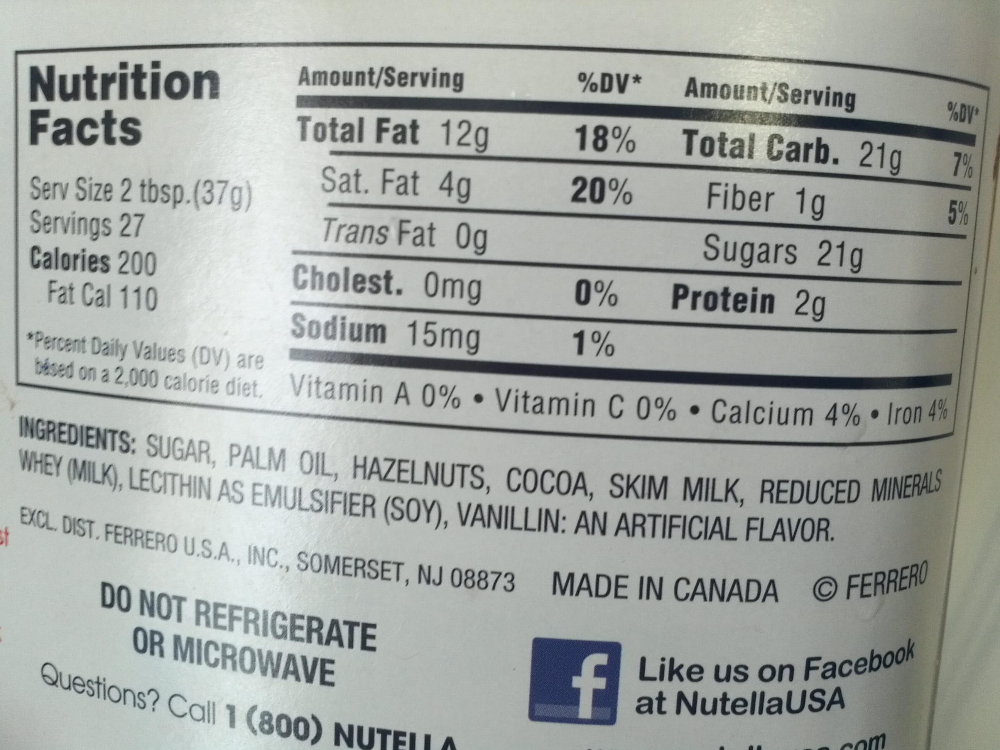

In [ ]:
actual_image

In [ ]:
sample_box_coords

[0.057098764926195145,
 0.014274691231548786,
 0.603501558303833,
 0.991126537322998]

In [ ]:
def convert_box_to_coordinates(box,height,width):
    if len(box) != 4:
        print("Box should be length of 4")
        return
    XTopLeft,YTopLeft, XBottomRight, YBottomRight = tuple(box)
    x_start = int(XTopLeft*width)
    y_start = int(YTopLeft*height)
    x_end = int(XBottomRight*width)
    y_end = int(YBottomRight*height)

    return (x_start,y_start,x_end,y_end)



In [ ]:
draw_this_box = convert_box_to_coordinates(sample_box_coords,sample_height,sample_width)

In [ ]:
draw_this_box

(147, 27, 1564, 1926)

In [ ]:
pencil = ImageDraw.Draw(actual_image)
pencil.rectangle(draw_this_box,fill=None,outline="red",width=3)

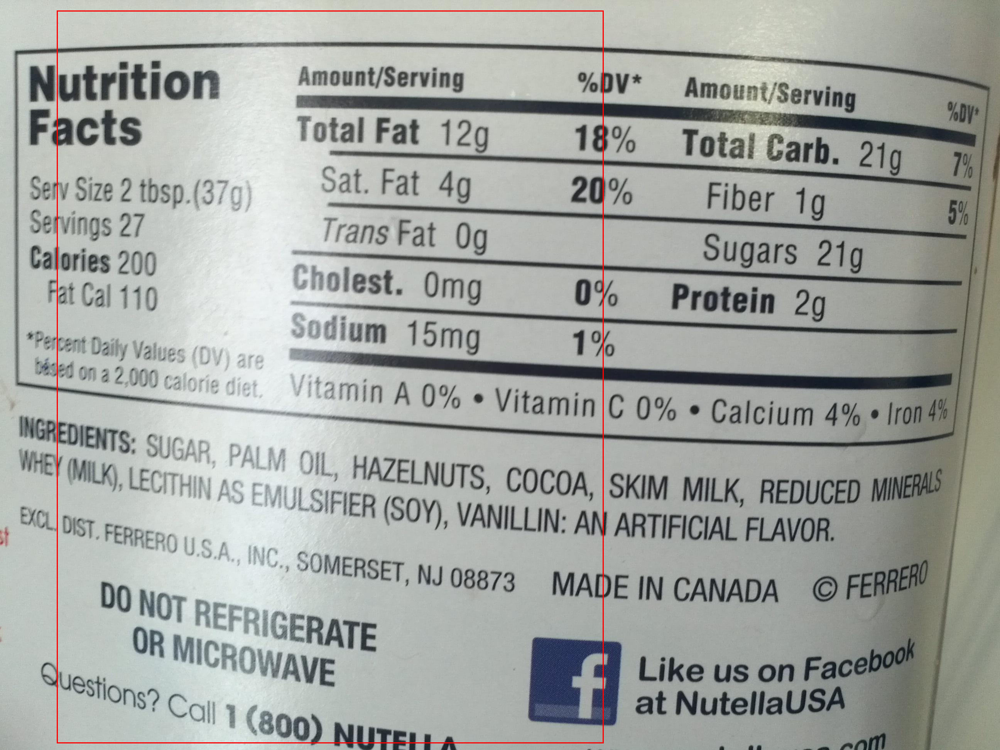

In [ ]:
actual_image.show()

In [ ]:
# Bug #1 Read the documentation
# My assumption was the bbox is exatcly as in paper
# but data provider swapped bbox: List of bounding boxes in the format (y_min, x_min, y_max, x_max).

# so here is a same just with correct order

def convert_box_to_coordinates_correct(box,height,width):
    if len(box) != 4:
        print("Box should be length of 4")
        return
    YTopLeft,XTopLeft,YBottomRight,XBottomRight = tuple(box)
    x_start = int(XTopLeft*width)
    y_start = int(YTopLeft*height)
    x_end = int(XBottomRight*width)
    y_end = int(YBottomRight*height)

    return (x_start,y_start,x_end,y_end)

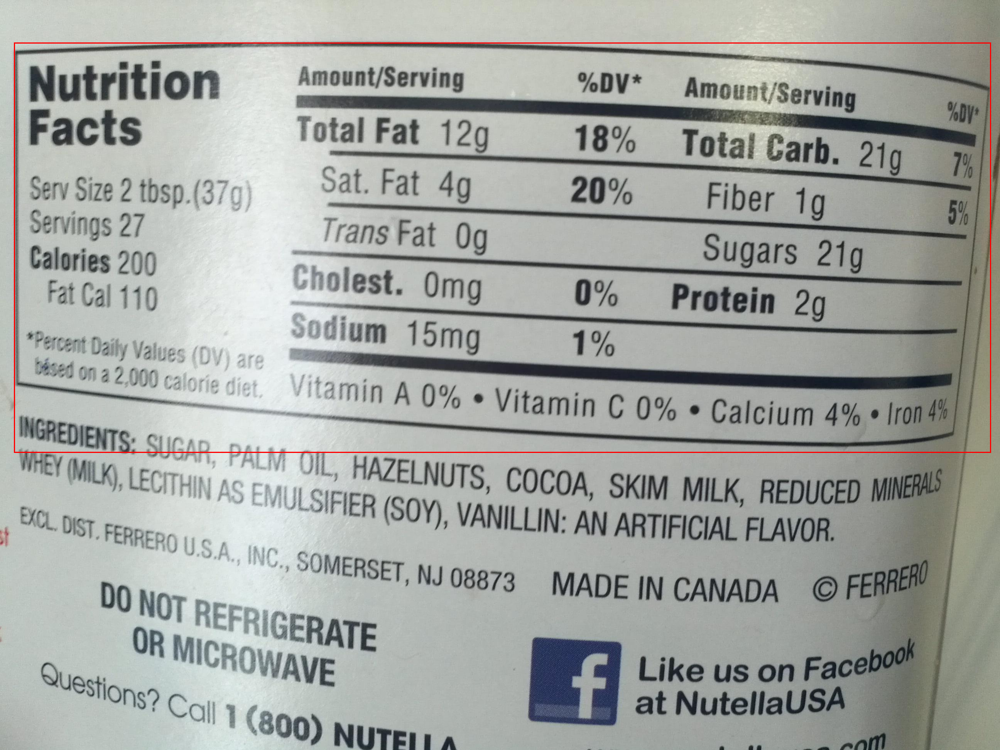

In [ ]:

sample = nutrition_data['train'][0]
sample_image = sample["image"]
sample_width = sample["width"]
sample_height = sample["height"]
sample_box_coords = sample["objects"]["bbox"][0]

draw_this_box = convert_box_to_coordinates_correct(sample_box_coords,sample_height,sample_width)
pencil = ImageDraw.Draw(sample_image)
pencil.rectangle(draw_this_box,fill=None,outline="red",width=3)
sample_image.show()

In [ ]:
# ok this is much better
# Lessons learned read data format



In [ ]:
# TASK: write an inference function for qwen2-vl
import torch
import os
import torch
from transformers import Qwen2VLForConditionalGeneration, Qwen2VLProcessor
from qwen_vl_utils import vision_process
from qwen_vl_utils import process_vision_info

In [ ]:
# 1) Understand the input format required by the model: Done
# 2) Explore apply_chat_template : Done
# 3) Understand process_vision_info : Done
# 4) Examine Processor
# 5) Analyze model,generate()


In [ ]:
# Can you create an example input where the user
# provides two images and one video?

# ok it follows the same chat_template format
# like a list of dictinaries
# images are straigforward
# for video it's a hassle I need to convert video into frames


In [ ]:
messages = [
    {
        "role":"user",
        "content":[
            {
                "type":"image",
                "image":"https://images.chesscomfiles.com/uploads/v1/images_users/tiny_mce/PedroPinhata/phpJfHzcl.png",
            },
            {
                "type":"image",
                "image":"https://images.chesscomfiles.com/uploads/v1/images_users/tiny_mce/Ognian_Mikov/php2nnXz9.png",

            },
            {
                "type":"text","text":"Provide all pawns in this image and respond in <|bbox|> format Clearly separate the two sets of detections."
            },
        ]
    }
]

In [ ]:
messages = [
    {
        "role":"user",
        "content":[
            {
                "type":"image",
                "image":"https://images.chesscomfiles.com/uploads/v1/images_users/tiny_mce/Ognian_Mikov/php2nnXz9.png",

            },
            {
                "type":"text","text":"Provide all pawns in this image and respond in <|bbox|> format"
            },
        ]
    }
]

In [ ]:
processor = AutoProcessor.from_pretrained("Qwen/Qwen2-VL-7B-Instruct")


text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)

In [ ]:
print("Hello")

Hello


In [ ]:
# ok so all tokens are familiar except for <|image_pad|> # like why ?
# ok interesting so <image_pad> turns out to be a placeholder for visual embeddings!
# for the actual
text

'<|im_start|>system\nYou are a helpful assistant.<|im_end|>\n<|im_start|>user\n<|vision_start|><|image_pad|><|vision_end|>Provide all pawns in this image and respond in <|bbox|> format<|im_end|>\n<|im_start|>assistant\n'

In [ ]:
#Understand `process_vision_info`
image_inputs,video_inputs = process_vision_info(messages)



In [ ]:
image_inputs # ok so it seems that process_vision_info takes the image
# and converts it into rgb format and changes dimensions to make it divisible by 28

# FUTURE TRAP: Nasty Future Bug
# I kind of don't like it, because now I need to calculate boxes after resize happened
# Verify:?


[<PIL.Image.Image image mode=RGB size=1932x1092>]

In [ ]:
! wget https://images.chesscomfiles.com/uploads/v1/images_users/tiny_mce/Ognian_Mikov/php2nnXz9.png

--2025-11-09 00:27:14--  https://images.chesscomfiles.com/uploads/v1/images_users/tiny_mce/Ognian_Mikov/php2nnXz9.png
Resolving images.chesscomfiles.com (images.chesscomfiles.com)... 104.17.165.82, 104.17.126.52
Connecting to images.chesscomfiles.com (images.chesscomfiles.com)|104.17.165.82|:443... connected.
HTTP request sent, awaiting response... 

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


200 OK
Length: 36479 (36K) [image/png]
Saving to: ‘php2nnXz9.png.3’

php2nnXz9.png.3     100%[===================>]  35.62K  --.-KB/s    in 0.001s  

2025-11-09 00:27:14 (32.2 MB/s) - ‘php2nnXz9.png.3’ saved [36479/36479]



In [ ]:
!stat php2nnXz9.png

  File: php2nnXz9.png
  Size: 36479     	Blocks: 72         IO Block: 65536  regular file
Device: 0,90	Inode: 111699711   Links: 1
Access: (0666/-rw-rw-rw-)  Uid: (    0/    root)   Gid: (    0/    root)
Access: 2025-11-08 23:37:45.000000000 +0000
Modify: 2022-11-17 05:40:56.000000000 +0000
Change: 2025-11-08 23:36:27.000000000 +0000
 Birth: -


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [ ]:
img = Image.open("php2nnXz9.png")

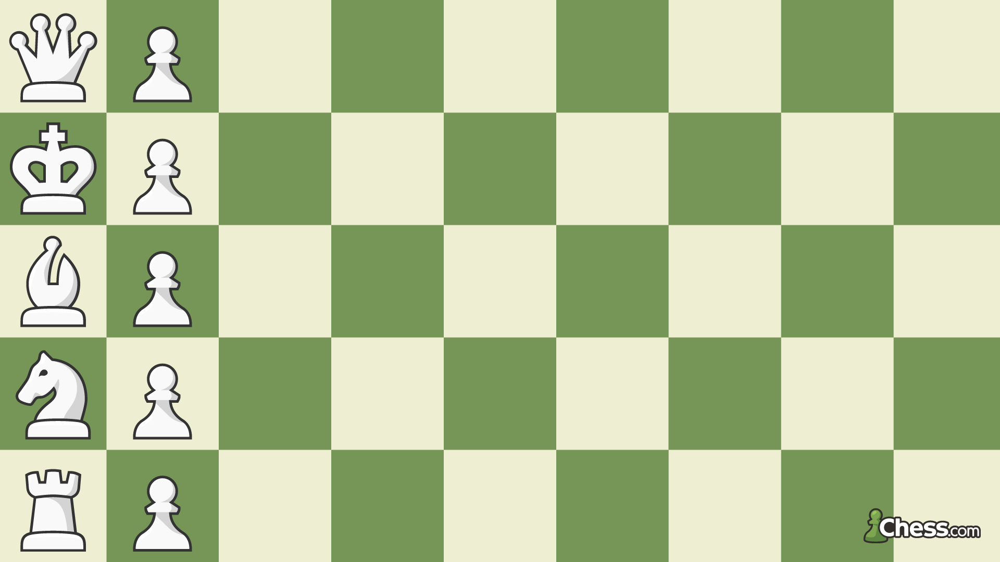

In [ ]:
img

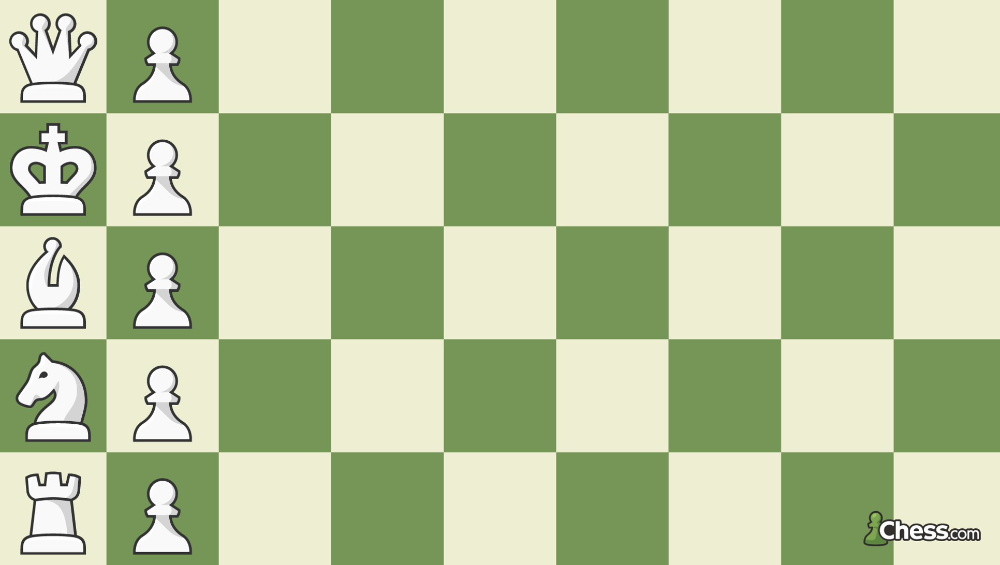

In [ ]:
image_inputs[0]

In [ ]:
img.size

(1920, 1080)

In [ ]:
# so as expected it changed the image to make sure that dimension is visible by 28 ?

width,height = image_inputs[0].size
print(height%28==0,width%28==0)

True True


In [ ]:
# next stage inputs for model
# so now I have my images in rgb format resized perfectly and aplied_chat_template
# which refers to those images

inputs = processor(text=[text],images=image_inputs,videos=video_inputs,padding=True,return_tensors="pt")

In [ ]:
for k in inputs.keys():
    print(k)

input_ids
attention_mask
pixel_values
image_grid_thw


In [ ]:
print(inputs["input_ids"].shape) # [batch_size,seq length] 2727 ?

torch.Size([1, 2727])


In [ ]:
print(inputs['attention_mask'])

tensor([[1, 1, 1,  ..., 1, 1, 1]])


In [ ]:
print(inputs['pixel_values'].shape)

torch.Size([10764, 1176])


In [ ]:
# ok this one is like what ?
print(inputs['image_grid_thw']) # ok I have image height patches 78, width patches 138


tensor([[  1,  78, 138]])


In [ ]:
1092/28

39.0

In [ ]:
1932/28

69.0

In [ ]:
# ok so what did happen why I am getting more patches than expected or literally double
# https://huggingface.co/Qwen/Qwen2-VL-7B-Instruct/blob/main/preprocessor_config.json
# so it's not 28 by 28 it's 14 by 14
# mind bug like don't know how did happen so like 4*7 = 28 , 2*7 = 14
# but again better to read docs

In [ ]:
78*138 # Total Patches
1176 # Embeddings per patch

10764

1176

In [ ]:
model = Qwen2VLForConditionalGeneration.from_pretrained(
    "Qwen/Qwen2-VL-7B-Instruct", torch_dtype="auto", device_map="auto"
)

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

Some parameters are on the meta device because they were offloaded to the cpu.


In [ ]:
inputs = inputs.to("cuda")

In [ ]:
generated_ids = model.generate(**inputs, max_new_tokens=128)

In [ ]:

# Step 1: Trimming - Remove the input prompt from output
generated_ids_trimmed = [
    out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]

output_text = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)
print(output_text)

['<|bbox|>111,111,166,166<|bbox|>111,250,166,305<|bbox|>111,441,166,496<|bbox|>111,637,166,692<|bbox|>111,828,166,883']


In [ ]:
# very interesting format like just awesome
# it like string which I guess I need to parse

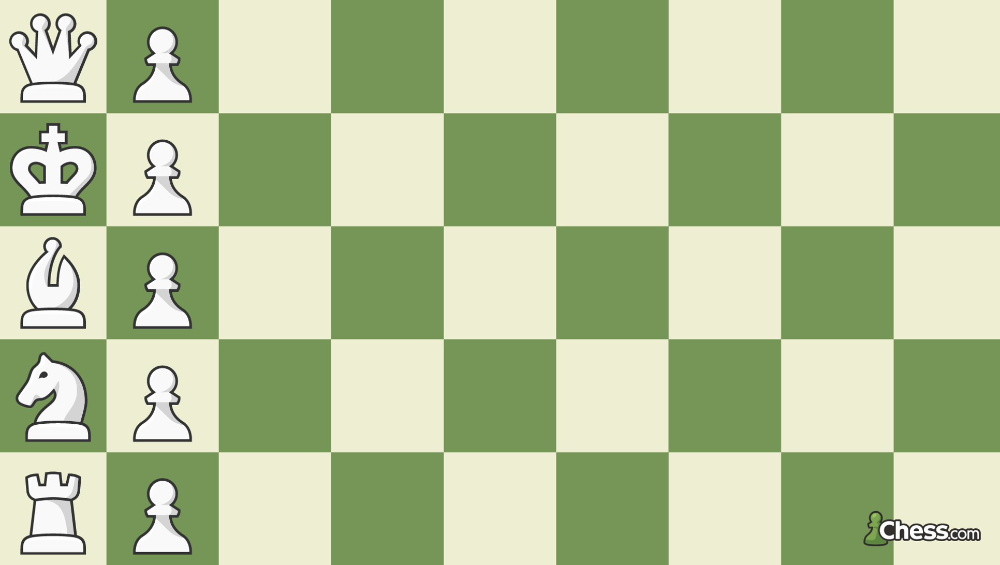

In [ ]:
image_inputs[0]

In [ ]:
# ok I am really curious what did happen visually there are total 5 pawns
# did it really found them ?

[111, 111, 166, 166]
[111, 250, 166, 305]
[111, 441, 166, 496]
[111, 637, 166, 692]
[111, 828, 166, 883]


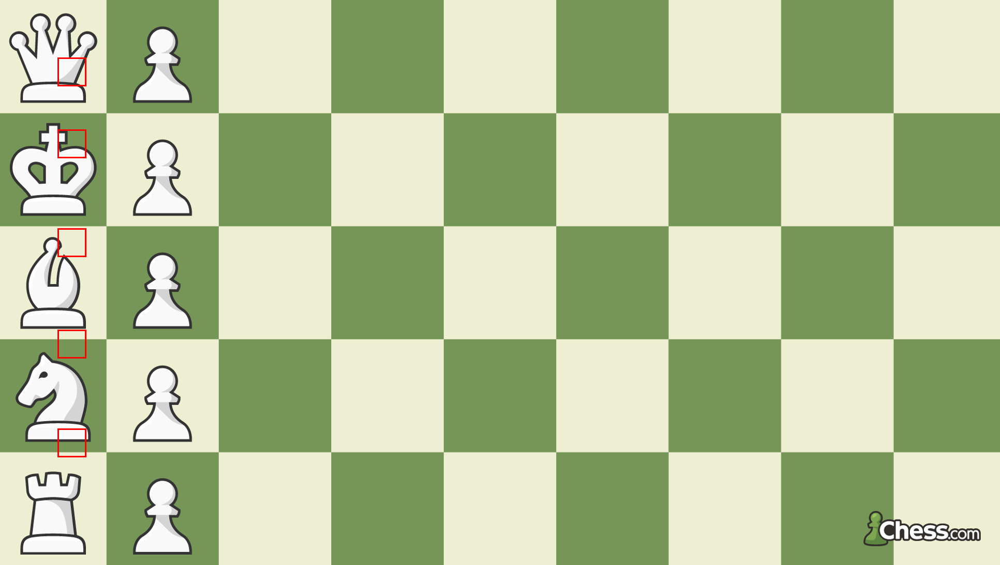

In [ ]:
output = output_text[0]
image = image_inputs[0]
import re
from PIL import ImageDraw

# Parse boxes
pattern = r'<\|bbox\|>(\d+),(\d+),(\d+),(\d+)'
boxes = [[int(x) for x in match] for match in re.findall(pattern, output)]

for b in boxes:
    print(b)
# Draw
draw = ImageDraw.Draw(image)
for x1, y1, x2, y2 in boxes:
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)

image.show()

# ok it doesn't look good number of pawns is correct but like it captures edges ?????

In [ ]:
# ok like don't know
!wget https://t4.ftcdn.net/jpg/01/57/82/05/360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg

--2025-11-09 00:43:31--  https://t4.ftcdn.net/jpg/01/57/82/05/360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg
Resolving t4.ftcdn.net (t4.ftcdn.net)... 151.101.1.91, 151.101.65.91, 151.101.129.91, ...
Connecting to t4.ftcdn.net (t4.ftcdn.net)|151.101.1.91|:443... connected.
HTTP request sent, awaiting response... 

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


200 OK
Length: 43907 (43K) [image/jpeg]
Saving to: ‘360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg.1’

360_F_157820583_age 100%[===================>]  42.88K  --.-KB/s    in 0.02s   

2025-11-09 00:43:32 (1.95 MB/s) - ‘360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg.1’ saved [43907/43907]



In [ ]:
# so last assignment find a red car
image_url = "https://t4.ftcdn.net/jpg/01/57/82/05/360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg"
prompt = "Detect the bounding box of the red car."
messages = [
    {
        "role":"user",
        "content":[
            {
                "type":"image",
                "image":image_url,

            },
            {
                "type":"text","text":f" {prompt}  and respond only in  <|bbox|> format"
            },
        ]
    }
]



In [ ]:
text = processor.apply_chat_template(
    messages, tokenize=False, add_generation_prompt=True
)
image_inputs, video_inputs = process_vision_info(messages)
inputs = processor(
    text=[text],
    images=image_inputs,
    videos=video_inputs,
    padding=True,
    return_tensors="pt",
)
inputs = inputs.to("cuda")

# Inference: Generation of the output
generated_ids = model.generate(**inputs, max_new_tokens=128)
generated_ids_trimmed = [
    out_ids[len(in_ids) :] for in_ids, out_ids in zip(inputs.input_ids, generated_ids)
]
output_text = processor.batch_decode(
    generated_ids_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
)
output_text

['[0.37, 0.56, 0.5, 0.87]']

[0.37, 0.56, 0.5, 0.87]
[[177, 201, 240, 313]]


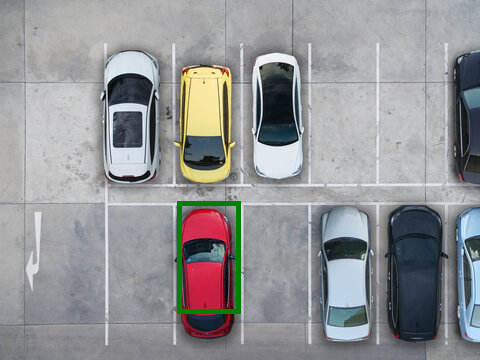

In [ ]:
output = output_text[0]
image = Image.open("360_F_157820583_agejYX5XeczPZuWRSCDF2YYeCGwJqUdG.jpg")
width, height = image.size  # ADD THIS LINE!

import re
from PIL import ImageDraw

# Parse boxes
pattern = r'\[([\d.]+),\s*([\d.]+),\s*([\d.]+),\s*([\d.]+)\]'
boxes = [[float(x) for x in match] for match in re.findall(pattern, output)]

# Then convert to pixels
pixel_boxes = []
for x1, y1, x2, y2 in boxes:
    pixel_boxes.append([
        int(x1 * width),
        int(y1 * height),
        int(x2 * width),
        int(y2 * height)
    ])

for b in boxes:
    print(b)

print(pixel_boxes)
# Draw
image_copy = image.copy()
draw = ImageDraw.Draw(image_copy)
for x1, y1, x2, y2 in pixel_boxes:
    draw.rectangle([x1, y1, x2, y2], outline="green", width=5)

image_copy.show()

# kind of ok, probably because of resizing